In [2]:
#import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas.testing as tm

In [3]:
#ML Packages
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

In [4]:
#load dataset
df = pd.read_csv("international_matches.csv")
df.head()

,date,home_team,away_team,home_team_continent,away_team_continent,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,...,shoot_out,home_team_result,home_team_goalkeeper_score,away_team_goalkeeper_score,home_team_mean_defense_score,home_team_mean_offense_score,home_team_mean_midfield_score,away_team_mean_defense_score,away_team_mean_offense_score,away_team_mean_midfield_score
0,1993-08-08,Bolivia,Uruguay,South America,South America,59,22,0,0,3,...,No,Win,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1993-08-08,Brazil,Mexico,South America,North America,8,14,0,0,1,...,No,Draw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1993-08-08,Ecuador,Venezuela,South America,South America,35,94,0,0,5,...,No,Win,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1993-08-08,Guinea,Sierra Leone,Africa,Africa,65,86,0,0,1,...,No,Win,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1993-08-08,Paraguay,Argentina,South America,South America,67,5,0,0,1,...,No,Lose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23921 entries, 0 to 23920
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   date                           23921 non-null  object 
 1   home_team                      23921 non-null  object 
 2   away_team                      23921 non-null  object 
 3   home_team_continent            23921 non-null  object 
 4   away_team_continent            23921 non-null  object 
 5   home_team_fifa_rank            23921 non-null  int64  
 6   away_team_fifa_rank            23921 non-null  int64  
 7   home_team_total_fifa_points    23921 non-null  int64  
 8   away_team_total_fifa_points    23921 non-null  int64  
 9   home_team_score                23921 non-null  int64  
 10  away_team_score                23921 non-null  int64  
 11  tournament                     23921 non-null  object 
 12  city                           23921 non-null 

In [6]:
df['date']=pd.to_datetime(df['date'])
df

,date,home_team,away_team,home_team_continent,away_team_continent,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,...,shoot_out,home_team_result,home_team_goalkeeper_score,away_team_goalkeeper_score,home_team_mean_defense_score,home_team_mean_offense_score,home_team_mean_midfield_score,away_team_mean_defense_score,away_team_mean_offense_score,away_team_mean_midfield_score
0,1993-08-08,Bolivia,Uruguay,South America,South America,59,22,0,0,3,...,No,Win,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1993-08-08,Brazil,Mexico,South America,North America,8,14,0,0,1,...,No,Draw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1993-08-08,Ecuador,Venezuela,South America,South America,35,94,0,0,5,...,No,Win,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1993-08-08,Guinea,Sierra Leone,Africa,Africa,65,86,0,0,1,...,No,Win,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1993-08-08,Paraguay,Argentina,South America,South America,67,5,0,0,1,...,No,Lose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23916,2022-06-14,Moldova,Andorra,Europe,Europe,180,153,932,1040,2,...,No,Win,65.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23917,2022-06-14,Liechtenstein,Latvia,Europe,Europe,192,135,895,1105,0,...,No,Lose,NaN,65.0,NaN,NaN,NaN,NaN,NaN,NaN
23918,2022-06-14,Chile,Ghana,South America,Africa,28,60,1526,1387,0,...,Yes,Lose,79.0,74.0,75.5,76.7,78.2,75.5,76.0,78.2
23919,2022-06-14,Japan,Tunisia,Asia,Africa,23,35,1553,1499,0,...,No,Lose,73.0,NaN,75.2,75.0,77.5,70.8,72.3,74.0


In [7]:
df.isnull().sum()

date                                 0
home_team                            0
away_team                            0
home_team_continent                  0
away_team_continent                  0
home_team_fifa_rank                  0
away_team_fifa_rank                  0
home_team_total_fifa_points          0
away_team_total_fifa_points          0
home_team_score                      0
away_team_score                      0
tournament                           0
city                                 0
country                              0
neutral_location                     0
shoot_out                            0
home_team_result                     0
home_team_goalkeeper_score       15542
away_team_goalkeeper_score       15826
home_team_mean_defense_score     16134
home_team_mean_offense_score     15411
home_team_mean_midfield_score    15759
away_team_mean_defense_score     16357
away_team_mean_offense_score     15609
away_team_mean_midfield_score    15942
dtype: int64

In [8]:
# Looking at null values
df.isnull().sum().sort_values(ascending=False)

away_team_mean_defense_score     16357
home_team_mean_defense_score     16134
away_team_mean_midfield_score    15942
away_team_goalkeeper_score       15826
home_team_mean_midfield_score    15759
away_team_mean_offense_score     15609
home_team_goalkeeper_score       15542
home_team_mean_offense_score     15411
country                              0
home_team_result                     0
shoot_out                            0
neutral_location                     0
date                                 0
home_team                            0
tournament                           0
away_team_score                      0
home_team_score                      0
away_team_total_fifa_points          0
home_team_total_fifa_points          0
away_team_fifa_rank                  0
home_team_fifa_rank                  0
away_team_continent                  0
home_team_continent                  0
away_team                            0
city                                 0
dtype: int64

In [9]:
df['home_team_goalkeeper_score']=df['home_team_goalkeeper_score'].fillna(df['home_team_goalkeeper_score'].mean())
df['away_team_goalkeeper_score']=df['away_team_goalkeeper_score'].fillna(df['away_team_goalkeeper_score'].mean())
df['home_team_mean_defense_score']=df['home_team_mean_defense_score'].fillna(df['home_team_mean_defense_score'].mean())
df['home_team_mean_offense_score']=df['home_team_mean_offense_score'].fillna(df['home_team_mean_offense_score'].mean())
df['home_team_mean_midfield_score']=df['home_team_mean_midfield_score'].fillna(df['home_team_mean_midfield_score'].mean())
df['away_team_mean_defense_score']=df['away_team_mean_defense_score'].fillna(df['away_team_mean_defense_score'].mean())
df['away_team_mean_offense_score']=df['away_team_mean_offense_score'].fillna(df['away_team_mean_offense_score'].mean())
df['away_team_mean_midfield_score']=df['away_team_mean_midfield_score'].fillna(df['away_team_mean_midfield_score'].mean())

In [10]:
df.drop("date", axis=1, inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23921 entries, 0 to 23920
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   home_team                      23921 non-null  object 
 1   away_team                      23921 non-null  object 
 2   home_team_continent            23921 non-null  object 
 3   away_team_continent            23921 non-null  object 
 4   home_team_fifa_rank            23921 non-null  int64  
 5   away_team_fifa_rank            23921 non-null  int64  
 6   home_team_total_fifa_points    23921 non-null  int64  
 7   away_team_total_fifa_points    23921 non-null  int64  
 8   home_team_score                23921 non-null  int64  
 9   away_team_score                23921 non-null  int64  
 10  tournament                     23921 non-null  object 
 11  city                           23921 non-null  object 
 12  country                        23921 non-null 

In [12]:
df.isnull().sum()

home_team                        0
away_team                        0
home_team_continent              0
away_team_continent              0
home_team_fifa_rank              0
away_team_fifa_rank              0
home_team_total_fifa_points      0
away_team_total_fifa_points      0
home_team_score                  0
away_team_score                  0
tournament                       0
city                             0
country                          0
neutral_location                 0
shoot_out                        0
home_team_result                 0
home_team_goalkeeper_score       0
away_team_goalkeeper_score       0
home_team_mean_defense_score     0
home_team_mean_offense_score     0
home_team_mean_midfield_score    0
away_team_mean_defense_score     0
away_team_mean_offense_score     0
away_team_mean_midfield_score    0
dtype: int64

In [13]:
df.shape

(23921, 24)

In [14]:
df['home_team_result'].value_counts()

Win     11761
Lose     6771
Draw     5389
Name: home_team_result, dtype: int64

In [15]:
df.describe

<bound method NDFrame.describe of             home_team     away_team home_team_continent away_team_continent  \
0             Bolivia       Uruguay       South America       South America   
1              Brazil        Mexico       South America       North America   
2             Ecuador     Venezuela       South America       South America   
3              Guinea  Sierra Leone              Africa              Africa   
4            Paraguay     Argentina       South America       South America   
...               ...           ...                 ...                 ...   
23916         Moldova       Andorra              Europe              Europe   
23917   Liechtenstein        Latvia              Europe              Europe   
23918           Chile         Ghana       South America              Africa   
23919           Japan       Tunisia                Asia              Africa   
23920  Korea Republic         Egypt                Asia              Africa   

       home_team_

In [16]:
objList = df.select_dtypes(include = "object").columns
print (objList)

Index(['home_team', 'away_team', 'home_team_continent', 'away_team_continent',
       'tournament', 'city', 'country', 'shoot_out', 'home_team_result'],
      dtype='object')


In [17]:
#Label Encoding for object to numeric conversion
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for feat in objList:
    df['home_team'] = le.fit_transform(df['home_team'].astype(str))
    df['away_team'] = le.fit_transform(df['away_team'].astype(str))
    df['home_team_continent'] = le.fit_transform(df['home_team_continent'].astype(str))
    df['away_team_continent'] = le.fit_transform(df['away_team_continent'].astype(str))
    df['tournament'] = le.fit_transform(df['tournament'].astype(str))
    df['city'] = le.fit_transform(df['city'].astype(str))
    df['country'] = le.fit_transform(df['country'].astype(str))
    df['shoot_out'] = le.fit_transform(df['shoot_out'].astype(str))
    df['home_team_result'] = le.fit_transform(df['home_team_result'].astype(str))

print (df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23921 entries, 0 to 23920
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   home_team                      23921 non-null  int32  
 1   away_team                      23921 non-null  int32  
 2   home_team_continent            23921 non-null  int32  
 3   away_team_continent            23921 non-null  int32  
 4   home_team_fifa_rank            23921 non-null  int64  
 5   away_team_fifa_rank            23921 non-null  int64  
 6   home_team_total_fifa_points    23921 non-null  int64  
 7   away_team_total_fifa_points    23921 non-null  int64  
 8   home_team_score                23921 non-null  int64  
 9   away_team_score                23921 non-null  int64  
 10  tournament                     23921 non-null  int32  
 11  city                           23921 non-null  int32  
 12  country                        23921 non-null 

In [18]:
boolList = df.select_dtypes(include = "boolean").columns
print (boolList)

Index(['neutral_location'], dtype='object')


In [19]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for feat in objList:
    df['neutral_location'] = le.fit_transform(df['neutral_location'].astype(str))
    
print (df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23921 entries, 0 to 23920
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   home_team                      23921 non-null  int32  
 1   away_team                      23921 non-null  int32  
 2   home_team_continent            23921 non-null  int32  
 3   away_team_continent            23921 non-null  int32  
 4   home_team_fifa_rank            23921 non-null  int64  
 5   away_team_fifa_rank            23921 non-null  int64  
 6   home_team_total_fifa_points    23921 non-null  int64  
 7   away_team_total_fifa_points    23921 non-null  int64  
 8   home_team_score                23921 non-null  int64  
 9   away_team_score                23921 non-null  int64  
 10  tournament                     23921 non-null  int32  
 11  city                           23921 non-null  int32  
 12  country                        23921 non-null 

In [20]:
df['home_team_result'].value_counts()

2    11761
1     6771
0     5389
Name: home_team_result, dtype: int64

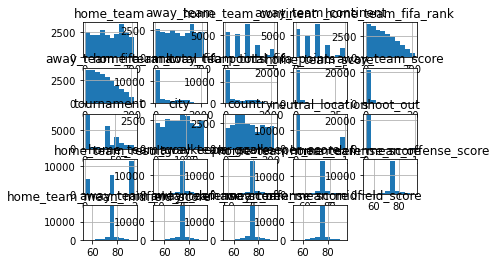

In [21]:
#histogram 
df.hist()
plt.show()

<AxesSubplot:>

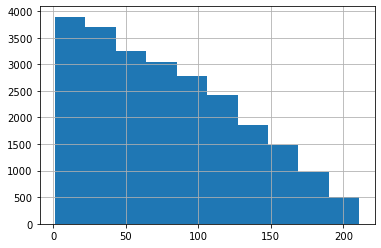

In [22]:
df['home_team_fifa_rank'].hist()

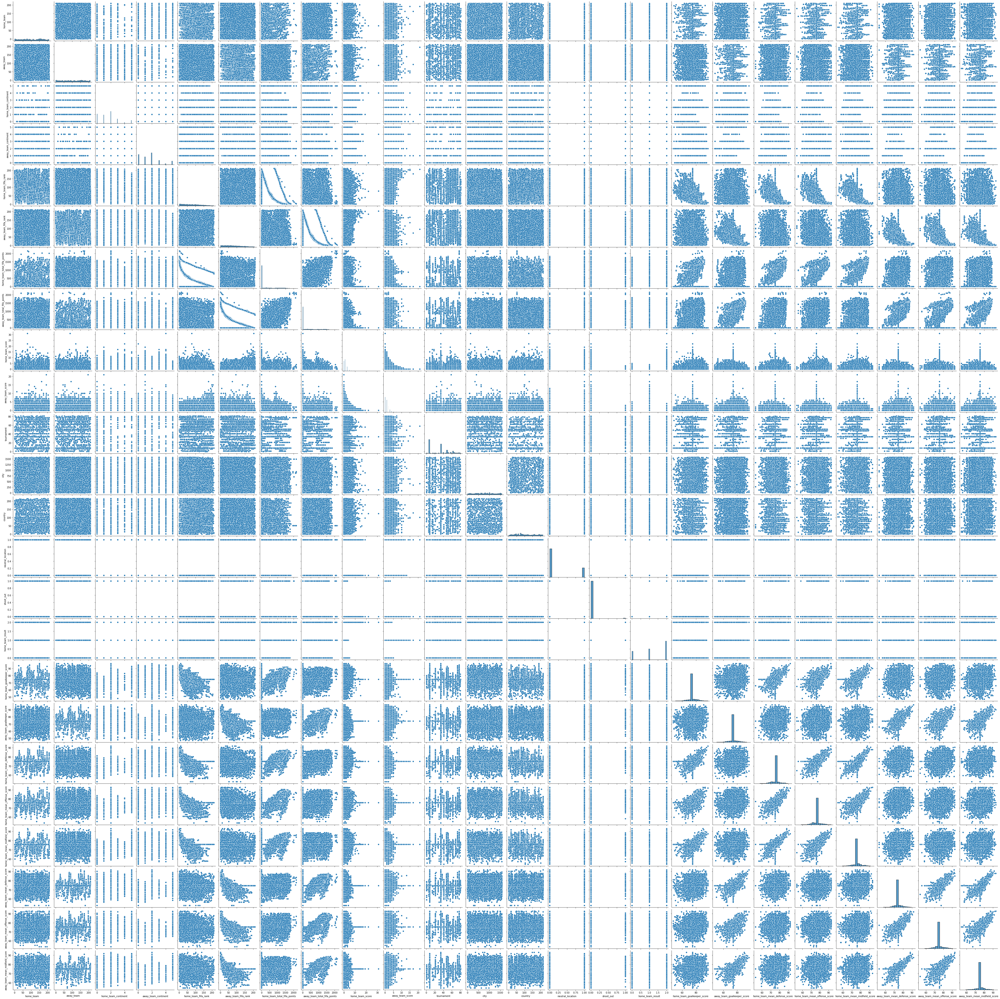

In [23]:
#multivariate plot
sns.pairplot(df)

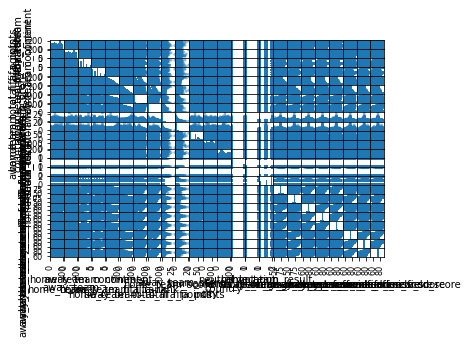

In [24]:
#scatter plot
from pandas.plotting import scatter_matrix
scatter_matrix(df)
plt.show()

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='home_team_result', ylabel='count'>

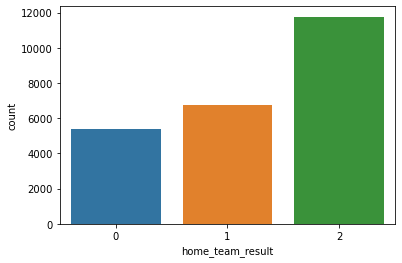

In [25]:
sns.countplot(df['home_team_result'])

In [26]:
#splitting validation
x = df.drop(columns=['home_team_result'])
y = df['home_team_result']
x

,home_team,away_team,home_team_continent,away_team_continent,home_team_fifa_rank,away_team_fifa_rank,home_team_total_fifa_points,away_team_total_fifa_points,home_team_score,away_team_score,...,neutral_location,shoot_out,home_team_goalkeeper_score,away_team_goalkeeper_score,home_team_mean_defense_score,home_team_mean_offense_score,home_team_mean_midfield_score,away_team_mean_defense_score,away_team_mean_offense_score,away_team_mean_midfield_score
0,74,210,5,5,59,22,0,0,3,1,...,0,0,74.963838,74.212477,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
1,81,174,5,3,8,14,0,0,1,1,...,0,0,74.963838,74.212477,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
2,129,56,5,5,35,94,0,0,5,0,...,0,0,74.963838,74.212477,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
3,14,34,0,0,65,86,0,0,1,0,...,0,0,74.963838,74.212477,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
4,20,160,5,5,67,5,0,0,1,3,...,0,0,74.963838,74.212477,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23916,179,107,2,2,180,153,932,1040,2,1,...,0,0,65.000000,74.212477,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
23917,13,196,2,2,192,135,895,1105,0,2,...,0,0,74.963838,65.000000,74.903249,75.818743,75.889292,74.424379,75.420019,75.259143
23918,109,141,5,0,28,60,1526,1387,0,0,...,1,1,79.000000,74.000000,75.500000,76.700000,78.200000,75.500000,76.000000,78.200000
23919,155,146,1,0,23,35,1553,1499,0,3,...,0,0,73.000000,74.212477,75.200000,75.000000,77.500000,70.800000,72.300000,74.000000


In [27]:
y

0        2
1        0
2        2
3        2
4        1
        ..
23916    2
23917    1
23918    1
23919    1
23920    2
Name: home_team_result, Length: 23921, dtype: int32

In [28]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2, random_state=3)

In [29]:
#import Scaler 
from sklearn.preprocessing import StandardScaler, MinMaxScaler

sc = MinMaxScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [30]:
x_train

array([[0.78571429, 0.06190476, 0.4       , ..., 0.55447125, 0.55717933,
        0.53997802],
       [0.47142857, 0.23333333, 0.2       , ..., 0.55447125, 0.55717933,
        0.53997802],
       [0.47619048, 0.7952381 , 0.4       , ..., 0.64102564, 0.58942065,
        0.76923077],
       ...,
       [0.25714286, 0.73809524, 0.2       , ..., 0.55447125, 0.46347607,
        0.5974359 ],
       [0.72857143, 0.9       , 0.6       , ..., 0.55447125, 0.55717933,
        0.53997802],
       [0.21904762, 0.88571429, 1.        , ..., 0.55447125, 0.55717933,
        0.53997802]])

In [31]:
y_train

822      2
11630    0
22849    0
13575    0
3212     2
        ..
6400     1
15288    1
11513    1
1688     0
5994     0
Name: home_team_result, Length: 19136, dtype: int32

In [32]:
x_test

array([[0.8047619 , 0.32380952, 0.2       , ..., 0.55447125, 0.55717933,
        0.53997802],
       [0.98571429, 0.7       , 0.6       , ..., 0.55447125, 0.55717933,
        0.53997802],
       [0.31428571, 0.63333333, 0.        , ..., 0.55447125, 0.55717933,
        0.53997802],
       ...,
       [0.24761905, 0.89047619, 0.4       , ..., 0.55447125, 0.55717933,
        0.17948718],
       [0.30952381, 0.07619048, 0.        , ..., 0.55447125, 0.55717933,
        0.53997802],
       [0.84285714, 0.54285714, 0.        , ..., 0.55447125, 0.55717933,
        0.53997802]])

In [33]:
y_test

5528     2
14568    2
2004     0
17836    0
17062    2
        ..
11269    2
2267     1
22493    1
4758     2
5087     1
Name: home_team_result, Length: 4785, dtype: int32

In [34]:
#logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
logistic_model = LogisticRegression(random_state=0)
logistic_model.fit(x_train,y_train)

C:\Users\User\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [35]:
y_predict = logistic_model.predict(x_test)
y_predict

array([2, 2, 1, ..., 1, 2, 1])

In [36]:
cm = confusion_matrix(y_test, y_predict)
cm

array([[ 892,  120,   65],
       [  80, 1254,   14],
       [   1,   23, 2336]], dtype=int64)

<AxesSubplot:>

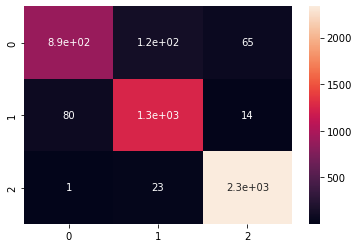

In [37]:
sns.heatmap(cm, annot=True)

In [38]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.92      0.83      0.87      1077
           1       0.90      0.93      0.91      1348
           2       0.97      0.99      0.98      2360

    accuracy                           0.94      4785
   macro avg       0.93      0.92      0.92      4785
weighted avg       0.94      0.94      0.94      4785



In [39]:
print("accuracy : ", logistic_model.score(x_test,y_test))

accuracy :  0.9366771159874608


In [40]:
import pickle
Pkl_Filename = "logistic_model.sav"  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(logistic_model, file)

In [41]:
with open(Pkl_Filename, 'rb') as file:  
    Pickled_LR_Model = pickle.load(file)
Pickled_LR_Model

LogisticRegression(random_state=0)